# PROJECT: Face Recognition

### Implementation of One-Shot Learning using Siamese Networks, with Contrastive & Triplet Losses
 > by Gürsu GÜLCÜ
 ##### Starter Siamese Network code was taken from https://github.com/KrisG04/Siamese-using-PyTorch/ 

## Imports

In [1]:
%matplotlib inline
%config InlineBackend.figure_format = 'retina'
import torch
import torch.nn as nn
import torchvision
from torchvision import datasets, models, transforms
from torch.utils.data import DataLoader,Dataset
import torch.nn.functional as F
from torch.nn.modules.distance import PairwiseDistance
import random
from collections import OrderedDict
import torch.optim as optim
from torch.autograd import Variable
import numpy as np
import matplotlib.pyplot as plt
import PIL
from PIL import Image
from IPython.display import display
import time
import json

# check if CUDA is available
train_on_gpu = torch.cuda.is_available()

if train_on_gpu:
     print('CUDA is available!  Training on GPU ...')
else:
    print('CUDA is not available.  Training on CPU is not recommended!') 

CUDA is available!  Training on GPU ...


## Prepare the Dataset as Pairs or Triplets
Select either a pair (for *DeepFace*) or a triplet (for *FaceNet*) of images from the dataset.

The **pair** must be selected from the same person and different people with equal frequency.

The **triplet** is always in this order: (Anchor, Positive, Negative) where Positive is another image of the same person as Anchor, and Negative is a different person than Anchor.  

In [2]:
# label=0 if both images are of the same person
# label=1 if the two images are from different people
class FacePairs(Dataset):    
    def __init__(self, dset):
        self.dset = dset
        
    def prep(self,img):
        im = Image.open(img[0])
        if self.dset.transform: im = self.dset.transform(im)
        return im       
        
    def __getitem__(self,index):
        img0 = random.choice(self.dset.imgs)
        getneg = np.random.randint(2)  # get a negative sample only 50% of the time
        while True:
            img1 = random.choice(self.dset.imgs) 
            if (not getneg) and img0[1]==img1[1]: break  # positive sample found
            if getneg and img0[1]!=img1[1]: break  # negative sample found

        im0, im1 = self.prep(img0), self.prep(img1) # prepare the two images
        label = torch.from_numpy(np.array([getneg],dtype=np.float32))  # as Tensor
        return im0, im1, label
    
    def __len__(self):
        return len(self.dset.imgs)

In [3]:
# Retrieve a triplet of (Anchor, Positive, Negative) images 
class FaceTriplets(Dataset):    
    def __init__(self, dset):
        self.dset = dset
        
    def prep(self,img):
        im = Image.open(img[0])
        if self.dset.transform: im = self.dset.transform(im)
        return im       
        
    def __getitem__(self,index):
        img0 = random.choice(self.dset.imgs)
        img1 = random.choice(self.dset.imgs)
        is2ndpos = img0[1]==img1[1]  # second is a Positive sample
        if is2ndpos:  
            while True:
                img2 = random.choice(self.dset.imgs)
                if img2[1]!=img0[1]: break  # third is a Negative sample
        else:  # second is a Negative sample
            while True:
                img2 = random.choice(self.dset.imgs)
                if img2[1]==img0[1]: break  # third is a Positive sample

        im0, im1, im2 = self.prep(img0), self.prep(img1), self.prep(img2) # prepare the triplet (A,P,N)
        if is2ndpos: return im0, im1, im2
        else: return im0, im2, im1  # always return (Anchor, Positive, Negative) triplet, in that order
    
    def __len__(self):
        return len(self.dset.imgs)

In [4]:
class Config():  # image locations & training params
    train_dir = "./17faces/train/"  # 14 people having 20 photos each
    valid_dir = "./17faces/valid/"  # 3 people having 20 photos each
    trainBatchContrast = 16
    trainEpochsContrast = 40
    trainBatchTriplet = 16
    trainEpochsTriplet = 30

In [5]:
# TODO: Gaussian filtering, data augmentation, normalization
# dtransforms = {'train': transforms.Compose([ transforms.RandomResizedCrop(224,scale=(0.4, 1.0)), 
#                        transforms.RandomHorizontalFlip(), transforms.ToTensor(), 
#                        transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225])  ]),
#                'valid': transforms.Compose([ transforms.Resize(256), transforms.CenterCrop(224),
#                        transforms.ToTensor(),  transforms.Normalize([0.485, 0.456, 0.406], [0.229, 0.224, 0.225]) ]) }

dtransforms = { 'train': transforms.Compose([ transforms.Resize((224,224)), transforms.ToTensor()  ]),
                'valid': transforms.Compose([ transforms.Resize((224,224)), transforms.ToTensor()  ])  }

dsets = {'train': datasets.ImageFolder(Config.train_dir, transform=dtransforms['train']),
            'valid': datasets.ImageFolder(Config.valid_dir, transform=dtransforms['valid']) }

pairs = FacePairs(dsets["train"])
triplets = FaceTriplets(dsets["train"])
len(pairs), len(triplets)

(279, 279)

## Visualise Samples from the Training Data

In [6]:
def imgshow(img, text=None):
    npimg = img.numpy()
    plt.axis("off")
    if text: plt.text(75, 8, text, style='italic',fontweight='bold',bbox={'facecolor':'white', 'alpha':0.8, 'pad':10})
    plt.imshow(np.transpose(npimg, (1, 2, 0)))
    plt.show() 

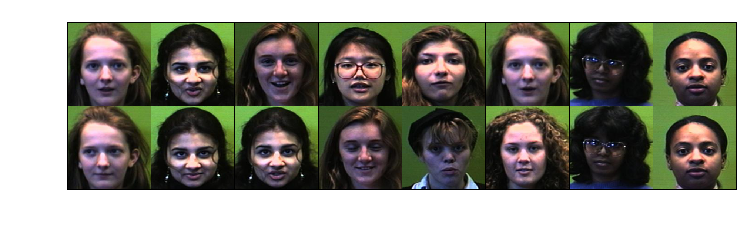

[[0. 0. 1. 1. 1. 1. 0. 0.]]


In [7]:
pairloader = DataLoader(pairs, shuffle=True, num_workers=4, batch_size=8)
dataiter = iter(pairloader)
examples = next(dataiter)
concatexs = torch.cat((examples[0],examples[1]),0)
imgshow(torchvision.utils.make_grid(concatexs)) # each column is a pair
print(examples[2].numpy().T)  # 0: same person, 1: different

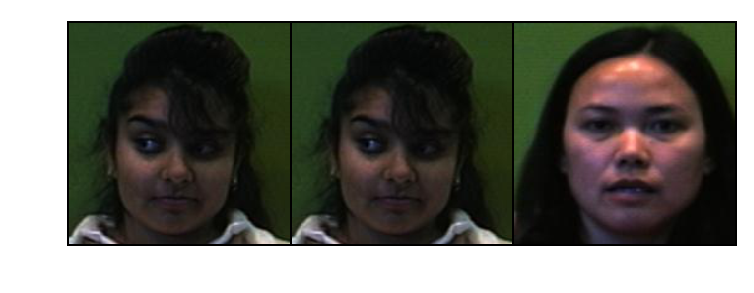

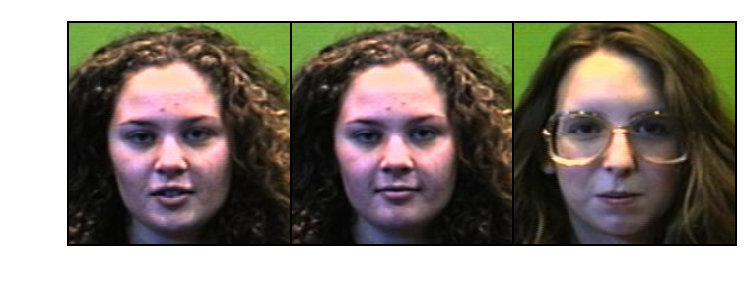

In [8]:
tripletloader = DataLoader(triplets, shuffle=True, num_workers=4, batch_size=1)
dataiter = iter(tripletloader)
for j in range(2):  # show samples (Anchor, Positive, Negative) triplets
    examples = next(dataiter)
    concatexs = torch.cat((examples[0], examples[1], examples[2]),0)
    imgshow(torchvision.utils.make_grid(concatexs))

## Define the Neural Network Model
Input all images of the pair/triplet to the same CNN (Siamese CNN) bu treat the contrastive loss differently for different and same pairs for DeepFace. Also define a triplet loss for FaceNet. 

As a design decision, with the aim of increasing both the accuracy and the speed of training of our model, we insert a ResNet CNN trained for the ImageNet classification task inside the Siamese Network. We did not freeze the already trained ResNet parameters and continue their training for our face recognition use case. However, a deep CNN seem to overfit our small dataset so we selected an easily trainable, small ResNet. 

Futhermore, we encode face images as vectors of dimension 64.

In [9]:
resnetEx = models.resnet18(pretrained=True)
resnetEx  # just for inspecting the layers of the ResNet, it will be redefied inside the Siamese Network below

Downloading: "https://download.pytorch.org/models/resnet18-5c106cde.pth" to /home/gursu/.torch/models/resnet18-5c106cde.pth
100%|██████████| 46827520/46827520 [00:16<00:00, 2885715.67it/s]


ResNet(
  (conv1): Conv2d(3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)
  (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  (relu): ReLU(inplace)
  (maxpool): MaxPool2d(kernel_size=3, stride=2, padding=1, dilation=1, ceil_mode=False)
  (layer1): Sequential(
    (0): BasicBlock(
      (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace)
      (conv2): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn2): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    )
    (1): BasicBlock(
      (conv1): Conv2d(64, 64, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1), bias=False)
      (bn1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
      (relu): ReLU(inplace)
      (conv2): Co

In [10]:
resnetEx = None
class SiameseNet(nn.Module):
    def __init__(self):
        super(SiameseNet, self).__init__()
        self.res = models.resnet18(pretrained=True)
        # for param in self.res.parameters(): param.requires_grad = False 
        self.res.fc = nn.Sequential(nn.Linear(512,256), nn.ReLU(inplace=True), nn.Dropout(0.4))
        self.fc1 = nn.Linear(256, 64)  # encoding is 64-dimensional

    def forwardone(self, x):
        y = self.res(x)
        y = self.fc1(y)
        return y

    def forward(self, x0, x1):
        y0 = self.forwardone(x0)
        y1 = self.forwardone(x1)
        return y0, y1

In [11]:
class FaceNet(nn.Module):
    def __init__(self):
        super(FaceNet, self).__init__()
        self.res = models.resnet18(pretrained=True)
        # for param in self.res.parameters(): param.requires_grad = False 
        self.res.fc = nn.Sequential(nn.Linear(512,256), nn.ReLU(inplace=True), nn.Dropout(0.4))
        self.fc1 = nn.Linear(256, 64)  # encoding is 64-dimensional

    def forwardone(self, x):
        y = self.res(x)
        y = self.fc1(y)
        return y

    def forward(self, x0, x1, x2):
        y0 = self.forwardone(x0)
        y1 = self.forwardone(x1)
        y2 = self.forwardone(x2)
        return y0, y1, y2

## Define Contrastive and Triplet Losses
> Contrastive Loss is described in: http://yann.lecun.com/exdb/publis/pdf/hadsell-chopra-lecun-06.pdf

> Triplet Loss is described in: https://arxiv.org/pdf/1503.03832.pdf

In [12]:
class ContrastiveLoss(nn.Module):
    def __init__(self, margin=2.0):
        super(ContrastiveLoss, self).__init__()
        self.margin = margin
        self.dist  = PairwiseDistance(2)
        
    def forward(self, y1, y2, label):
        distance = self.dist(y1, y2)
        loss = torch.mean( (1-label)*torch.pow(distance, 2)
                + label*torch.pow(torch.clamp(self.margin-distance,min=0.0),2))
        return loss

In [13]:
class TripletLoss(nn.Module):    
    def __init__(self, margin=0.2):
        super(TripletLoss, self).__init__()
        self.margin = margin
        self.dist  = PairwiseDistance(2)
        
    def forward(self, anchor, positive, negative):
        APdist = self.dist.forward(anchor, positive)
        ANdist = self.dist.forward(anchor, negative)
        clampdist = torch.clamp(self.margin + APdist - ANdist, min=0.0)
        loss = torch.mean(clampdist)
        return loss

## Train with Contrastive Loss

In [14]:
modelContrast = None
trainLoaderContrast = DataLoader(pairs, shuffle=True, num_workers=4, batch_size=Config.trainBatchContrast)
modelContrast = SiameseNet().cuda()
criterion = ContrastiveLoss()
optimizer = optim.Adam(modelContrast.parameters(), lr = 0.0001 )

In [15]:
epochs = Config.trainEpochsContrast
loss_histContrast = []
modelContrast.train()
for epoch in range(epochs):
    train_loss = 0.0
    for data in trainLoaderContrast:
        img0, img1, label = data
        img0, img1, label = img0.cuda(), img1.cuda(), label.cuda()
        optimizer.zero_grad()
        y1, y2 = modelContrast(img0, img1)
        loss_contrastive = criterion(y1, y2, label)
        loss_contrastive.backward()
        optimizer.step()
        train_loss += loss_contrastive.item()*len(data)
    trn_loss = train_loss/len(trainLoaderContrast.dataset)
    print("Epoch: {}\t Current loss: {:.4f}".format(epoch, trn_loss))
    loss_histContrast.append(trn_loss)

Epoch: 0	 Current loss: 0.3644
Epoch: 1	 Current loss: 0.2019
Epoch: 2	 Current loss: 0.2014
Epoch: 3	 Current loss: 0.1984
Epoch: 4	 Current loss: 0.1989
Epoch: 5	 Current loss: 0.2006
Epoch: 6	 Current loss: 0.1992
Epoch: 7	 Current loss: 0.1986
Epoch: 8	 Current loss: 0.2018
Epoch: 9	 Current loss: 0.2014
Epoch: 10	 Current loss: 0.2011
Epoch: 11	 Current loss: 0.1995
Epoch: 12	 Current loss: 0.2018
Epoch: 13	 Current loss: 0.2031
Epoch: 14	 Current loss: 0.2028
Epoch: 15	 Current loss: 0.2014
Epoch: 16	 Current loss: 0.1988
Epoch: 17	 Current loss: 0.2041
Epoch: 18	 Current loss: 0.2007
Epoch: 19	 Current loss: 0.2011
Epoch: 20	 Current loss: 0.2016
Epoch: 21	 Current loss: 0.1996
Epoch: 22	 Current loss: 0.2003
Epoch: 23	 Current loss: 0.1997
Epoch: 24	 Current loss: 0.2012
Epoch: 25	 Current loss: 0.2040
Epoch: 26	 Current loss: 0.1988
Epoch: 27	 Current loss: 0.2006
Epoch: 28	 Current loss: 0.2017
Epoch: 29	 Current loss: 0.2043
Epoch: 30	 Current loss: 0.2016
Epoch: 31	 Current

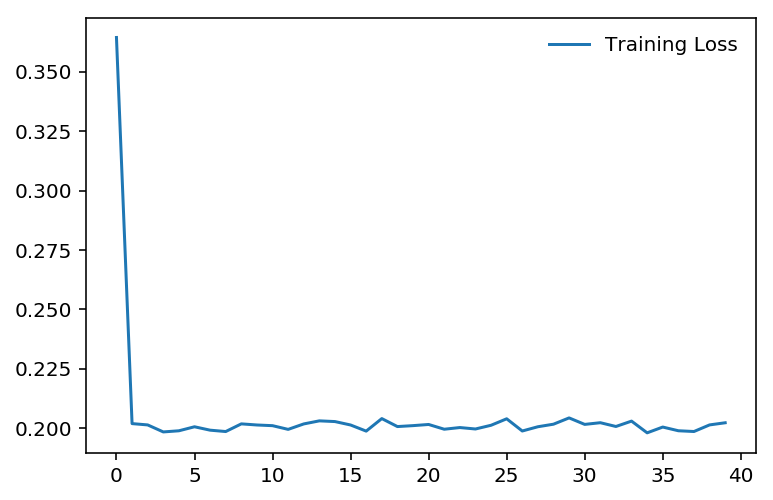

In [16]:
plt.plot(loss_histContrast, label='Training Loss')
plt.legend(frameon=False)

## Train with Triplet Loss

In [17]:
modelTriplet = None
trainLoaderTriplet = DataLoader(triplets, shuffle=True, num_workers=4, batch_size=Config.trainBatchTriplet)
modelTriplet = FaceNet().cuda()
criterion = TripletLoss()
optimizer = optim.Adam(modelTriplet.parameters(), lr = 0.0001 )

In [18]:
epochs = Config.trainEpochsTriplet
loss_histTriplet = []
modelTriplet.train()
for epoch in range(epochs):
    train_loss = 0.0
    for data in trainLoaderTriplet:
        img0, img1, img2 = data
        img0, img1, img2 = img0.cuda(), img1.cuda(), img2.cuda()
        optimizer.zero_grad()
        y0, y1, y2 = modelTriplet(img0, img1, img2)
        loss_triplet = criterion(y0, y1, y2)
        loss_triplet.backward()
        optimizer.step()
        train_loss += loss_triplet.item() * len(data)
    trn_loss = train_loss/len(trainLoaderTriplet.dataset)
    print("Epoch: {}\t Current loss: {:.4f}".format(epoch, trn_loss))
    loss_histTriplet.append(trn_loss)

Epoch: 0	 Current loss: 0.0077
Epoch: 1	 Current loss: 0.0027
Epoch: 2	 Current loss: 0.0027
Epoch: 3	 Current loss: 0.0007
Epoch: 4	 Current loss: 0.0012
Epoch: 5	 Current loss: 0.0009
Epoch: 6	 Current loss: 0.0003
Epoch: 7	 Current loss: 0.0003
Epoch: 8	 Current loss: 0.0001
Epoch: 9	 Current loss: 0.0002
Epoch: 10	 Current loss: 0.0009
Epoch: 11	 Current loss: 0.0013
Epoch: 12	 Current loss: 0.0007
Epoch: 13	 Current loss: 0.0004
Epoch: 14	 Current loss: 0.0008
Epoch: 15	 Current loss: 0.0008
Epoch: 16	 Current loss: 0.0003
Epoch: 17	 Current loss: 0.0006
Epoch: 18	 Current loss: 0.0004
Epoch: 19	 Current loss: 0.0005
Epoch: 20	 Current loss: 0.0004
Epoch: 21	 Current loss: 0.0005
Epoch: 22	 Current loss: 0.0001
Epoch: 23	 Current loss: 0.0003
Epoch: 24	 Current loss: 0.0012
Epoch: 25	 Current loss: 0.0018
Epoch: 26	 Current loss: 0.0006
Epoch: 27	 Current loss: 0.0010
Epoch: 28	 Current loss: 0.0004
Epoch: 29	 Current loss: 0.0002


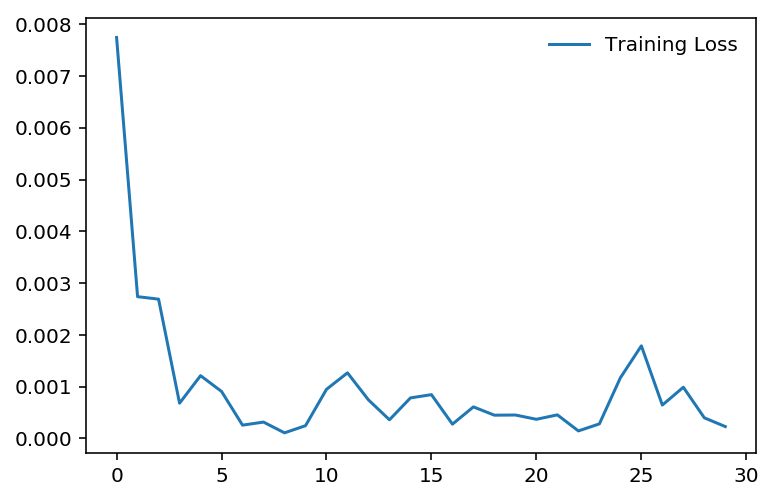

In [19]:
plt.plot( loss_histTriplet, label='Training Loss')
plt.legend(frameon=False)

## Sample Results on the Validation Dataset
3 of the 17 people were held out from the training in order to be used in the validation of our model. The Euclidean Distance
between each image pair shows the degree of similarity calculated by our models. Ideally, two pictures of the same person have very low dissimilarity (distance), whereas images of two different people have high dissimilarity scores.

We note that for the contrastive model, setting a threshold slightly above 0.2 would enable us to distinguish images of the same face from images of other faces. The threshold is higher for the model with triplet loss, around 1.

### Similarity Predictions of the Contrastive Model

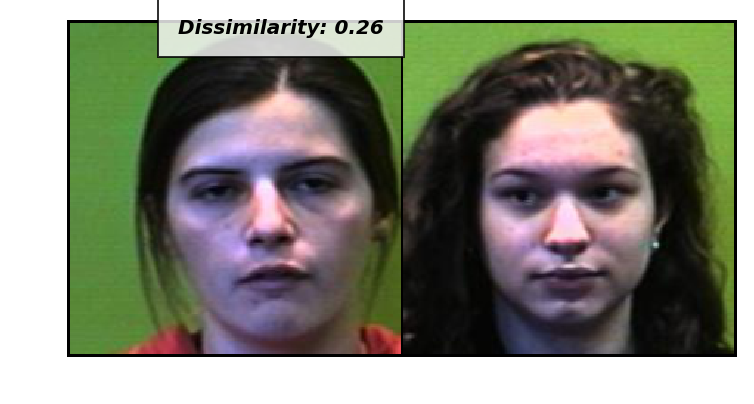

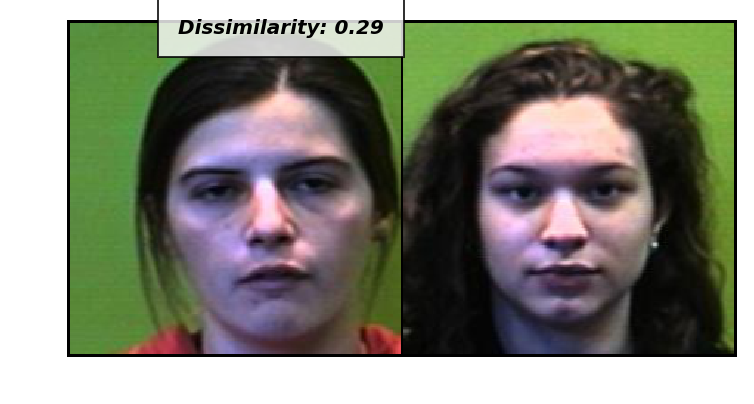

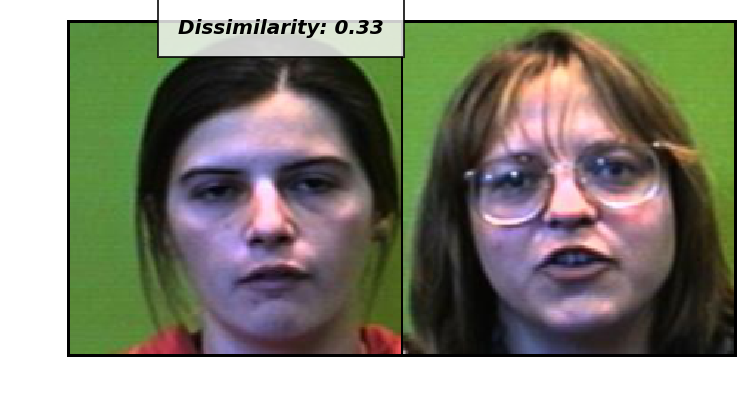

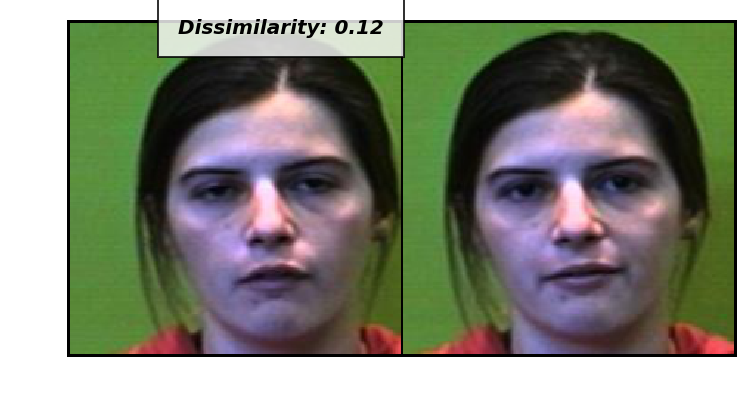

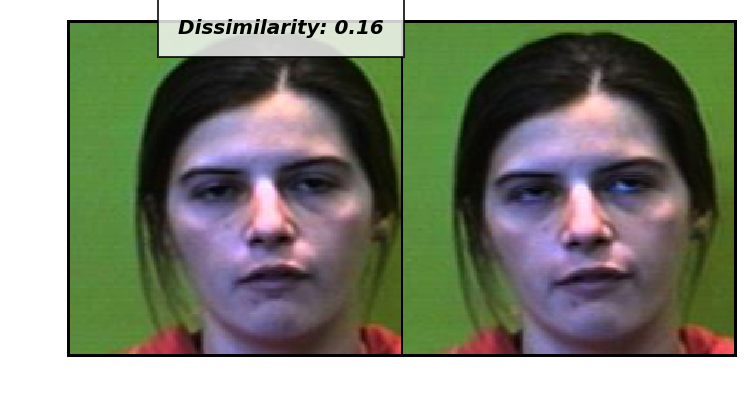

...

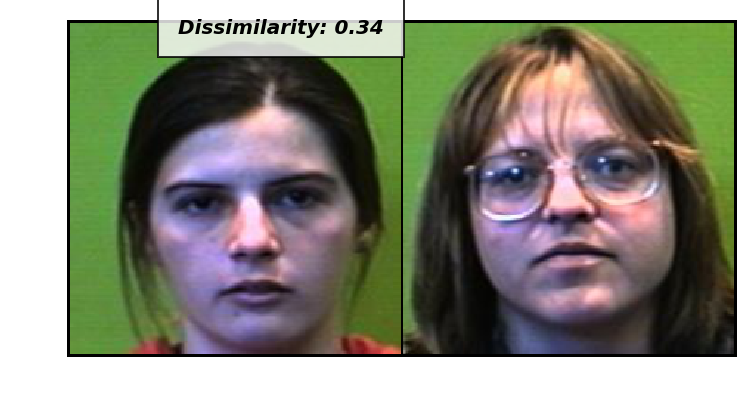

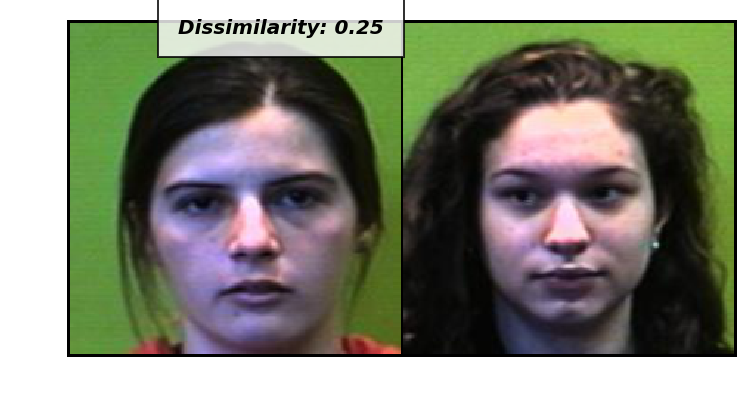

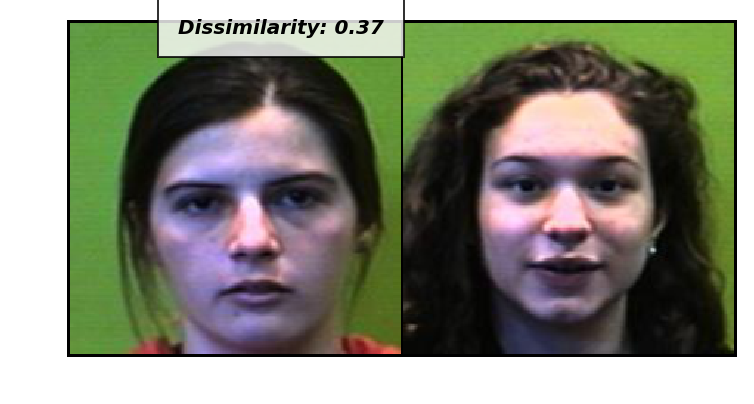

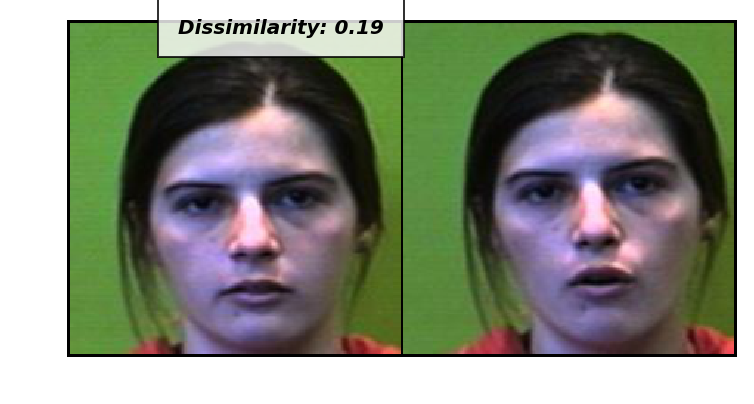

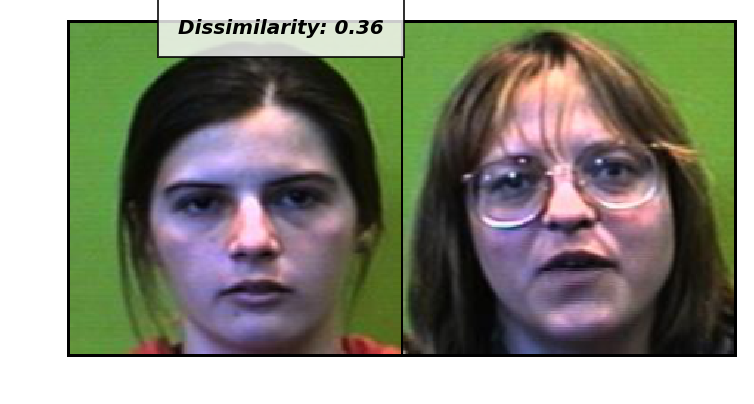

In [20]:
modelContrast.eval()
dset_valid = dsets["valid"]
pairs_valid = FacePairs(dset_valid)

validloader = DataLoader(pairs_valid, num_workers=4, batch_size=1, shuffle=True)
dataiter = iter(validloader)
for j in range(5):
    x0, _, _ = next(dataiter)
    for i in range(5):
        _, x1, label2 = next(dataiter)
        concatenated = torch.cat((x0, x1),0)
        y0, y1 = modelContrast(Variable(x0).cuda(), Variable(x1).cuda())
        euclidean_distance = F.pairwise_distance(y0, y1)
        imgshow(torchvision.utils.make_grid(concatenated),'Dissimilarity: {:.2f}'.format(euclidean_distance.item()))

### Similarity Predictions of the Model with Triplet Loss

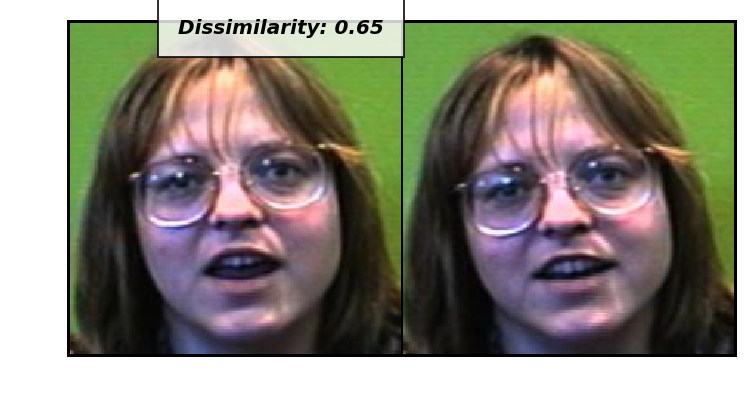

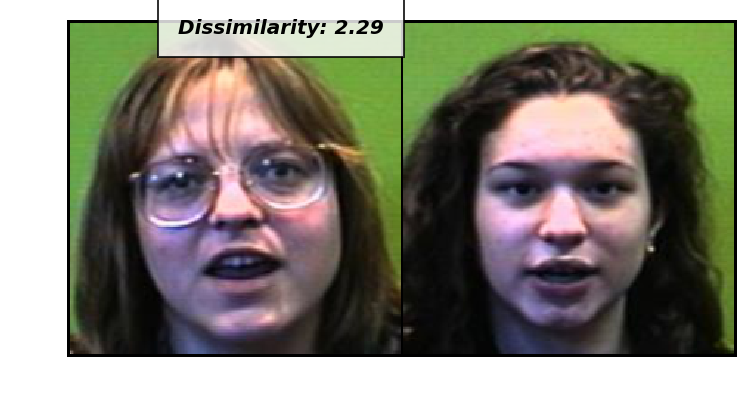

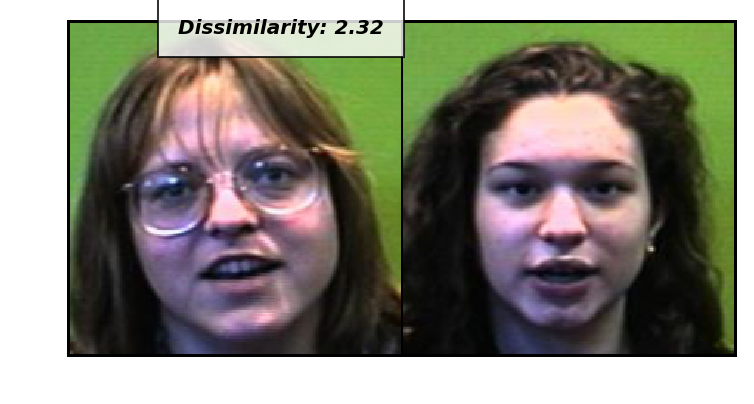

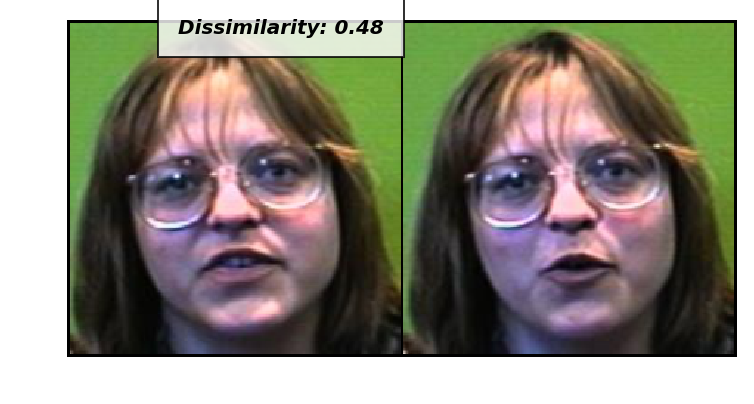

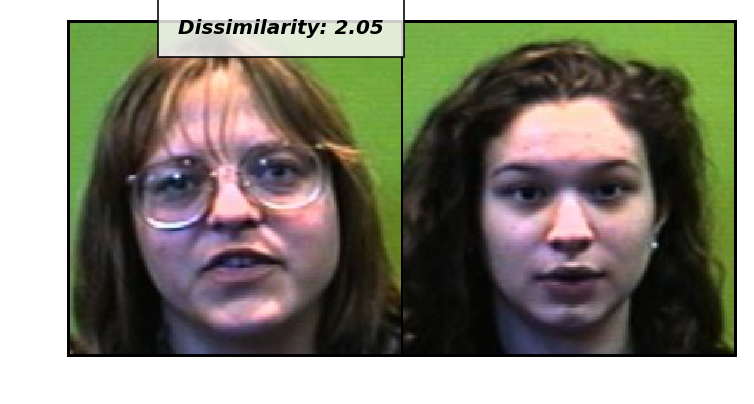

...

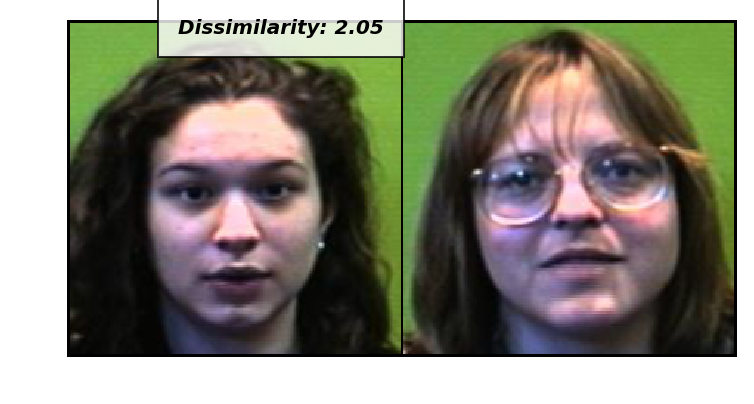

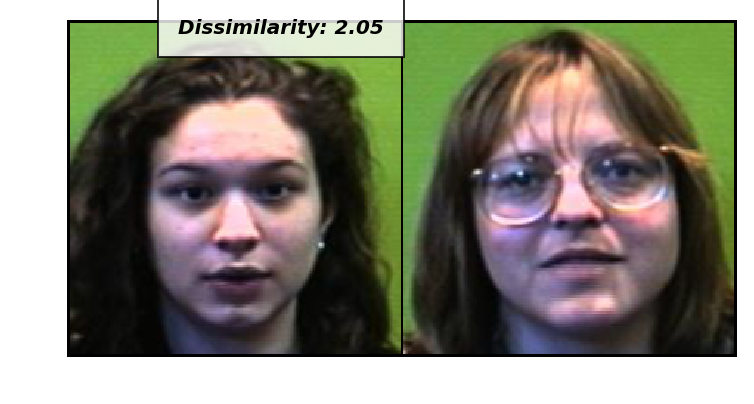

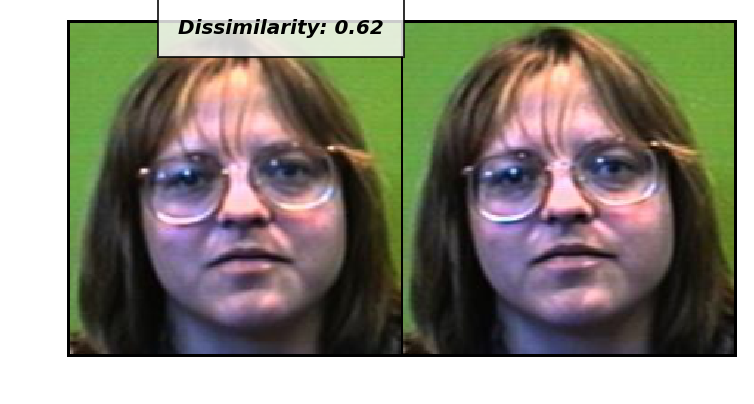

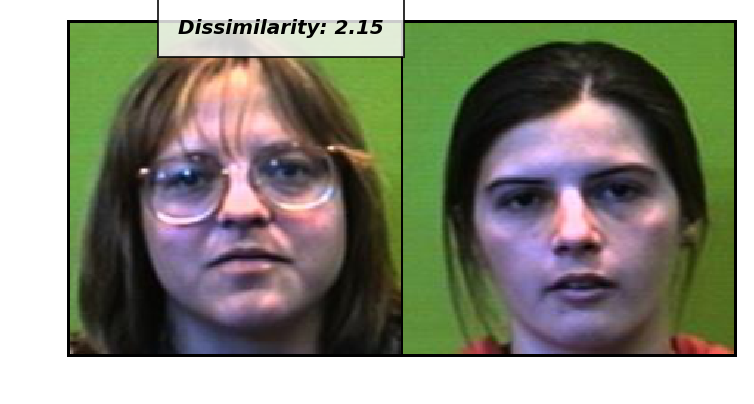

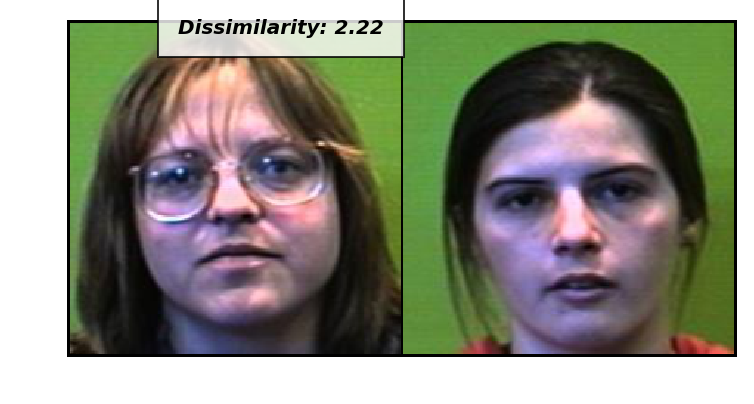

In [21]:

modelTriplet.eval()
dset_valid = dsets["valid"]
triplets_valid = FaceTriplets(dset_valid)
validloader = DataLoader(triplets_valid, num_workers=4, batch_size=1, shuffle=True)
dataiter = iter(validloader)
for j in range(8):
    x0, x1, x2 = next(dataiter)
    concat01 = torch.cat((x0,x1),0)
    concat02 = torch.cat((x0,x2),0)
    concat12 = torch.cat((x1,x2),0)
    y0, y1, y2 = modelTriplet(Variable(x0).cuda(), Variable(x1).cuda() , Variable(x2).cuda())
    imgshow(torchvision.utils.make_grid(concat01),'Dissimilarity: {:.2f}'.format(F.pairwise_distance(y0, y1).item()))
    imgshow(torchvision.utils.make_grid(concat02),'Dissimilarity: {:.2f}'.format(F.pairwise_distance(y0, y2).item()))
    imgshow(torchvision.utils.make_grid(concat12),'Dissimilarity: {:.2f}'.format(F.pairwise_distance(y1, y2).item()))